## Libraries + Import

In [1]:
import matplotlib.pyplot as plt
from pathlib import Path
import os
import pandas as pd
import random
from PIL import Image
from concurrent.futures import ThreadPoolExecutor
from collections import Counter
import numpy as np
import cv2

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Subset

import torchvision.transforms as T
from torchvision.datasets import ImageFolder
from torchvision.models import resnet18, ResNet18_Weights

import lightning.pytorch as pl
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint
from lightning.pytorch.loggers import TensorBoardLogger
from torchmetrics.classification import BinaryAccuracy, BinaryF1Score, BinaryAUROC
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

In [2]:
PROJECT_ROOT = Path.cwd().parent

DATASET_PATH = PROJECT_ROOT / "datasets" / "140k_real_fake_faces"

TRAIN_PATH = DATASET_PATH / "train"
VALID_PATH = DATASET_PATH / "valid"
TEST_PATH  = DATASET_PATH / "test"

print("Project root:", PROJECT_ROOT)
print("Dataset:", DATASET_PATH)
print("Train:", TRAIN_PATH)

Project root: c:\Users\tomma\DeepfakeSII
Dataset: c:\Users\tomma\DeepfakeSII\datasets\140k_real_fake_faces
Train: c:\Users\tomma\DeepfakeSII\datasets\140k_real_fake_faces\train


## EDA

### Label Distribution

In [3]:
def get_label_distribution(train_path, valid_path, test_path):

    splits = {
        "train": train_path,
        "valid": valid_path,
        "test": test_path
    }

    rows = []

    for split_name, split_path in splits.items():

        for class_name in ["real", "fake"]:

            count = sum(
                file.lower().endswith((".jpg", ".jpeg", ".png"))
                for file in os.listdir(split_path / class_name)
            )

            rows.append({
                "split": split_name,
                "label": class_name,
                "count": count
            })

    return pd.DataFrame(rows)

distribution_df = get_label_distribution(TRAIN_PATH, VALID_PATH, TEST_PATH)
distribution_df

,split,label,count
0,train,real,50000
1,train,fake,50000
2,valid,real,10000
3,valid,fake,10000
4,test,real,10000
5,test,fake,10000


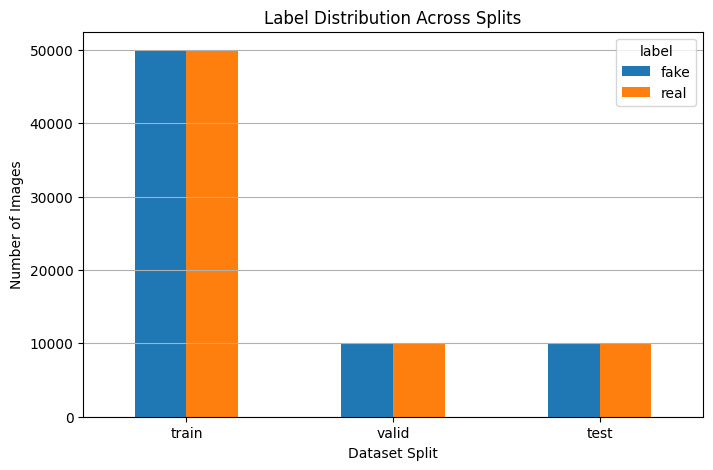

In [4]:
def plot_label_distribution(distribution_df):

    ordered_splits = ["train", "valid", "test"]

    pivot_df = distribution_df.pivot(
        index="split",
        columns="label",
        values="count"
    ).loc[ordered_splits]

    pivot_df.plot(kind="bar", figsize=(8, 5))

    plt.title("Label Distribution Across Splits")
    plt.xlabel("Dataset Split")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=0)
    plt.grid(axis="y")

    plt.show()

plot_label_distribution(distribution_df)

### Examples

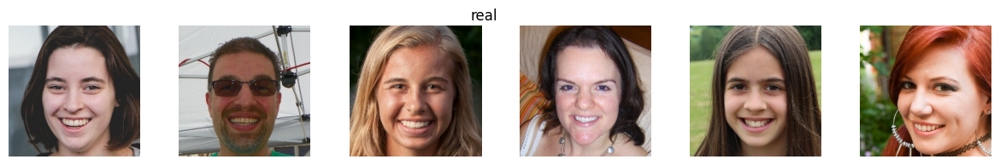

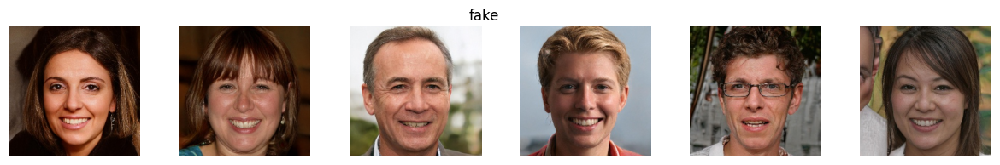

In [5]:
def show_random_images(split_path, class_name, n=6):

    class_path = split_path / class_name

    image_files = [
        f for f in os.listdir(class_path)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]

    fig, axes = plt.subplots(1, n, figsize=(15, 2))

    for ax, file_name in zip(axes, random.sample(image_files, n)):

        ax.imshow(Image.open(class_path / file_name))
        ax.axis("off")

    plt.suptitle(class_name)
    plt.show()


show_random_images(TRAIN_PATH, "real")
show_random_images(TRAIN_PATH, "fake")

### Image Resolution check

In [ ]:
def get_resolution_distribution_all_splits(train_path, valid_path, test_path, max_images=None, seed=42):

    splits = {
        "train": train_path,
        "valid": valid_path,
        "test": test_path
    }

    rows = []

    for split_name, split_path in splits.items():

        image_paths = []

        for class_name in ["real", "fake"]:

            class_path = split_path / class_name

            for file in os.listdir(class_path):
                if file.lower().endswith((".jpg", ".jpeg", ".png")):
                    image_paths.append(class_path / file)

        if max_images is not None:
            random.seed(seed)
            image_paths = random.sample(image_paths, min(max_images, len(image_paths)))

        resolutions = []

        for image_path in image_paths:

            try:
                image = Image.open(image_path)
                resolutions.append(image.size)

            except:
                pass

        counter = Counter(resolutions)

        for (w, h), count in counter.items():
            rows.append({
                "split": split_name,
                "resolution": f"{w}x{h}",
                "width": w,
                "height": h,
                "count": count
            })

    resolution_df = pd.DataFrame(rows)

    return resolution_df.sort_values(by=["split", "count"], ascending=[True, False])

In [ ]:
resolution_df = get_resolution_distribution_all_splits(TRAIN_PATH, VALID_PATH, TEST_PATH, max_images=None) # 10min
resolution_df

,split,resolution,width,height,count
2,test,256x256,256,256,20000
0,train,256x256,256,256,100000
1,valid,256x256,256,256,20000


### RGB mean/std

In [ ]:
# RGB stats by class and set
def compute_mean_std_by_class(split_path, sample_per_class=1000):

    results = {}

    for class_name in ["real", "fake"]:

        class_path = split_path / class_name

        # take filename in the folder
        files = [
            file for file in os.listdir(class_path)
            if file.lower().endswith((".jpg", ".jpeg", ".png"))
        ]

        # take a random subsample
        files = random.sample(files, min(sample_per_class, len(files)))

        # init
        channel_sum = np.zeros(3)
        channel_sum_sq = np.zeros(3)
        total_pixels = 0

        # idea: keep in ram only one image at a time (and the cumulative sums)
        for file in files:

            image = Image.open(class_path / file).convert("RGB")
            image = image.resize((224, 224))
            array = np.asarray(image, dtype=np.float32) / 255.0
            pixels = array.reshape(-1, 3)

            channel_sum += pixels.sum(axis=0)
            channel_sum_sq += (pixels ** 2).sum(axis=0)

            total_pixels += pixels.shape[0]

        mean = channel_sum / total_pixels
        std = np.sqrt((channel_sum_sq / total_pixels) - (mean ** 2))

        results[class_name] = {"mean": mean, "std": std}

    return results

In [47]:
rows = []

splits = {
    "train": TRAIN_PATH,
    "valid": VALID_PATH,
    "test": TEST_PATH
}

for split_name, split_path in splits.items():

    stats = compute_mean_std_by_class(
        split_path,
        sample_per_class=1000
    )

    for class_name in ["real", "fake"]:

        mean = stats[class_name]["mean"]
        std = stats[class_name]["std"]

        rows.append({
            "split": split_name,
            "class": class_name,

            "mean_R": round(mean[0], 4),
            "mean_G": round(mean[1], 4),
            "mean_B": round(mean[2], 4),

            "std_R": round(std[0], 4),
            "std_G": round(std[1], 4),
            "std_B": round(std[2], 4)
        })

stats_df = pd.DataFrame(rows)

stats_df

,split,class,mean_R,mean_G,mean_B,std_R,std_G,std_B
0,train,real,0.5298,0.4291,0.3823,0.2781,0.2524,0.2533
1,train,fake,0.5253,0.4287,0.3816,0.2762,0.2514,0.2519
2,valid,real,0.5134,0.4203,0.3739,0.2822,0.2550,0.2554
3,valid,fake,0.5171,0.4209,0.3766,0.2774,0.2493,0.2491
4,test,real,0.5166,0.4239,0.3784,0.2797,0.2530,0.2548
5,test,fake,0.5231,0.4279,0.3826,0.2754,0.2519,0.2538


RGB stats are consistent across sets (no distribution shifts) and across classes (the model cannot cheat using chromatic bias as a shortcut)

### File format (.jpg) check

In [33]:
extensions = set()

for split_path in [TRAIN_PATH, VALID_PATH, TEST_PATH]:
    for class_name in ["real", "fake"]:
        class_path = split_path / class_name
        for file in os.listdir(class_path):
            extensions.add(os.path.splitext(file)[1].lower())

print(extensions)

{'.jpg'}


### File size check

In [34]:
rows = []

for split_name, split_path in splits.items():

    for class_name in ["real", "fake"]:

        class_path = split_path / class_name

        sizes = []

        for file in os.listdir(class_path):

            file_path = class_path / file 
            sizes.append(os.path.getsize(file_path) / 1024)  # KB

        rows.append({
            "split": split_name,
            "class": class_name,
            "mean_size_kb": round(np.mean(sizes), 2),
            "std_size_kb": round(np.std(sizes), 2),
        })

file_size_df = pd.DataFrame(rows)
file_size_df

,split,class,mean_size_kb,std_size_kb
0,train,real,28.26,3.88
1,train,fake,27.77,3.86
2,valid,real,28.23,3.84
3,valid,fake,27.71,3.84
4,test,real,28.28,3.89
5,test,fake,27.74,3.87


### Face statistics

In [ ]:
def extract_face_features_all_splits(train_path, valid_path, test_path, face_detector, sample_per_class=1000, seed=22):

    splits = {
        "train": train_path,
        "valid": valid_path,
        "test": test_path
    }

    random.seed(seed)

    rows = []

    for split_name, split_path in splits.items():

        for class_name in ["real", "fake"]:

            class_path = split_path / class_name

            # take filename in the folder
            files = [file for file in os.listdir(class_path) if file.lower().endswith((".jpg", ".jpeg", ".png"))]

            random.shuffle(files)

            detected = 0
            processed = 0

            for file in files:
                
                # if we already found enough faces for this class, stop
                if detected >= sample_per_class: break

                processed += 1

                try:

                    image = Image.open(class_path / file).convert("RGB")
                    image = image.resize((224, 224))
                    image = np.asarray(image)
                    H, W = image.shape[:2]
                    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

                    # apply OpenCV Face Detector, which returns a list of bounding boxes (x, y, w, h) of the face
                    faces = face_detector.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

                    if len(faces) == 0: continue

                    # if it detected multiple faces, take the largest one
                    x, y, w, h = max(faces, key=lambda face: face[2] * face[3])

                    # res
                    rows.append({
                        "split": split_name,
                        "class": class_name,

                        "center_x": (x + w / 2) / W,
                        "center_y": (y + h / 2) / H,

                        "bbox_width": w / W,
                        "bbox_height": h / H,

                        "face_area_ratio": (w * h) / (W * H)
                    })

                    detected += 1

                except:
                    pass

            print(
                f"{split_name} | {class_name}: "
                f"{detected} faces from {processed} images"
            )

    return pd.DataFrame(rows)

In [ ]:
face_detector = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
face_df = extract_face_features_all_splits(TRAIN_PATH, VALID_PATH, TEST_PATH, face_detector, sample_per_class=1000)

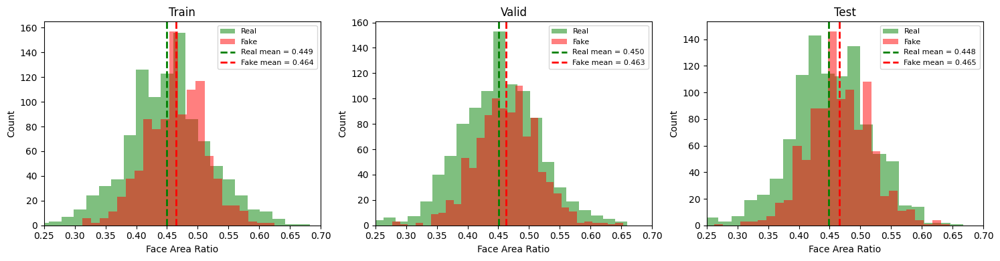

In [161]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for ax, split in zip(axes, ["train", "valid", "test"]):

    split_df = face_df[face_df["split"] == split]

    # face area ratio distributions
    real_ratios = split_df[split_df["class"] == "real"]["face_area_ratio"]
    fake_ratios = split_df[split_df["class"] == "fake"]["face_area_ratio"]

    ax.hist(real_ratios, bins=30, alpha=0.5, color="green", label="Real")
    ax.hist(fake_ratios, bins=30, alpha=0.5, color="red", label="Fake")

    # mean face area ratio for each class
    real_mean = real_ratios.mean()
    fake_mean = fake_ratios.mean()

    ax.axvline(real_mean, color="green", linestyle="--", linewidth=2, label=f"Real mean = {real_mean:.3f}")
    ax.axvline(fake_mean, color="red", linestyle="--", linewidth=2, label=f"Fake mean = {fake_mean:.3f}")

    ax.set_title(split.capitalize())
    ax.set_xlim(0.25, 0.70)
    ax.set_xlabel("Face Area Ratio")
    ax.set_ylabel("Count")
    ax.legend(fontsize=8)

plt.tight_layout()
plt.show()

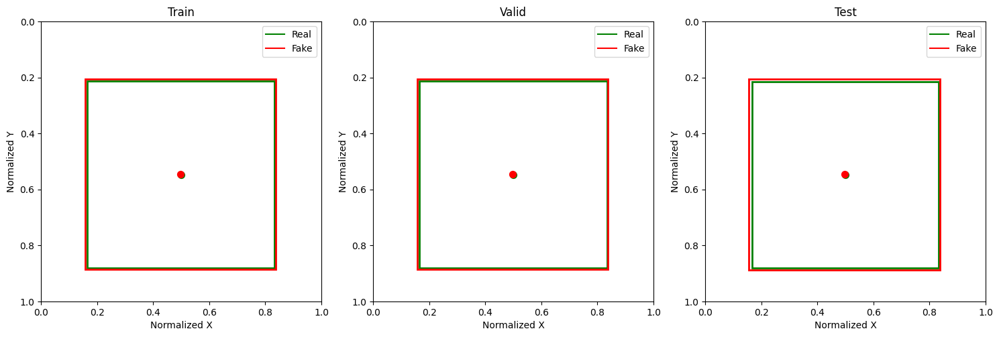

In [162]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for ax, split in zip(axes, ["train", "valid", "test"]):

    split_df = face_df[face_df["split"] == split]

    for class_name, color in [("real", "green"), ("fake", "red")]:

        class_df = split_df[split_df["class"] == class_name]

        # mean face center
        mean_x = class_df["center_x"].mean()
        mean_y = class_df["center_y"].mean()

        # mean bounding box size
        mean_w = class_df["bbox_width"].mean()
        mean_h = class_df["bbox_height"].mean()

        # draw the average bounding box
        rect = plt.Rectangle(
            (mean_x - mean_w / 2, mean_y - mean_h / 2),
            mean_w,
            mean_h,
            fill=False,
            linewidth=2,
            color=color
        )

        ax.add_patch(rect)

        # draw the average face center
        ax.scatter(mean_x, mean_y, color=color, s=50)

    # normalized image coordinates
    ax.set_xlim(0, 1)
    ax.set_ylim(1, 0)

    ax.set_aspect("equal")

    ax.set_title(split.capitalize())

    ax.set_xlabel("Normalized X")
    ax.set_ylabel("Normalized Y")

    ax.legend(
        [
            plt.Line2D([0], [0], color="green"),
            plt.Line2D([0], [0], color="red")
        ],
        ["Real", "Fake"]
    )

plt.tight_layout()
plt.show()

C:\Users\tomma\AppData\Local\Temp\ipykernel_26876\3007379292.py:25: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(
C:\Users\tomma\AppData\Local\Temp\ipykernel_26876\3007379292.py:25: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(
C:\Users\tomma\AppData\Local\Temp\ipykernel_26876\3007379292.py:25: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(
C:\Users\tomma\AppData\Local\Temp\ipykernel_26876\3007379292.py:25: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxpl

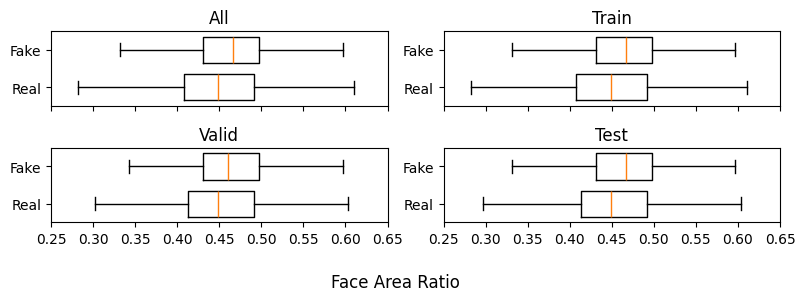

In [169]:
fig, axes = plt.subplots(2, 2, figsize=(8, 3), sharex=True)
axes = axes.flatten()

plots = [
    ("All", None),
    ("Train", "train"),
    ("Valid", "valid"),
    ("Test", "test")
]

for ax, (title, split) in zip(axes, plots):

    if split is None:
        # all splits together ("All")
        real_ratios = face_df[face_df["class"] == "real"]["face_area_ratio"]
        fake_ratios = face_df[face_df["class"] == "fake"]["face_area_ratio"]

    else:
        # current split only ("Train", "Valid", "Test")
        split_df = face_df[face_df["split"] == split]
        real_ratios = split_df[split_df["class"] == "real"]["face_area_ratio"]
        fake_ratios = split_df[split_df["class"] == "fake"]["face_area_ratio"]

    # horizontal boxplots without outliers
    ax.boxplot(
        [real_ratios, fake_ratios],
        vert=False,
        widths=0.7, # bar widths
        showfliers=False, # outliers
        labels=["Real", "Fake"]
    )

    ax.set_title(title)
    ax.set_xlim(0.25, 0.65)

fig.supxlabel("Face Area Ratio")

plt.tight_layout()
plt.show()

In [174]:
summary_global = (
    face_df
    .groupby("class")
    .agg(
        center_x_mean=("center_x", "mean"),
        center_y_mean=("center_y", "mean"),
        face_ratio_mean=("face_area_ratio", "mean"),
        face_ratio_std=("face_area_ratio", "std")
    )
    .round(4)
)

print(summary_global)

       center_x_mean  center_y_mean  face_ratio_mean  face_ratio_std
class                                                               
fake          0.4969         0.5467           0.4643          0.0501
real          0.4995         0.5476           0.4492          0.0699


### Frequency

In [214]:
# returns mean fft and mean radial profile for each class
def extract_frequency_features(train_path, sample_per_class=1000, seed=22):

    random.seed(seed)

    spectra = {"real": [], "fake": []}
    profiles = {"real": [], "fake": []}

    for class_name in ["real", "fake"]:

        class_path = train_path / class_name

        files = [file for file in os.listdir(class_path) if file.lower().endswith((".jpg", ".jpeg", ".png"))]

        random.shuffle(files)

        collected = 0

        for file in files:

            if collected >= sample_per_class:
                break

            try:

                image = Image.open(class_path / file).convert("L") # grayscale
                image = image.resize((224, 224))
                image = np.asarray(image)

                # FFT
                fft = np.fft.fft2(image) # 2D Fourier Transform
                fft = np.fft.fftshift(fft) # shift zero frequency to center

                spectrum = np.log(np.abs(fft) + 1) # compute log magnitude spectrum

                spectra[class_name].append(spectrum)

                # radial profile
                H, W = spectrum.shape

                cx = W // 2
                cy = H // 2

                y, x = np.indices(spectrum.shape) # coordinates

                radius = np.sqrt((x - cx) ** 2 + (y - cy) ** 2).astype(int) # distance from center (for each point)

                profile = (np.bincount(radius.ravel(), weights=spectrum.ravel()) / np.bincount(radius.ravel())) # compute mean spectrum value for each ring (radius)
                profiles[class_name].append(profile)

                collected += 1

            except:
                pass

    # average over all samples for each class
    spectra["real"] = np.mean(spectra["real"], axis=0)
    spectra["fake"] = np.mean(spectra["fake"], axis=0)

    profiles["real"] = np.mean(profiles["real"], axis=0)
    profiles["fake"] = np.mean(profiles["fake"], axis=0)

    return spectra, profiles

In [215]:
spectra, profiles = extract_frequency_features(
    TRAIN_PATH,
    sample_per_class=1000
)

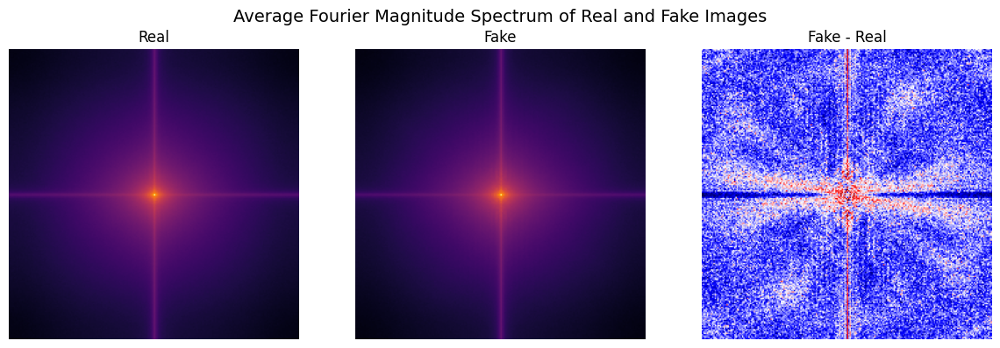

In [236]:
fig, ax = plt.subplots(1, 3, figsize=(12,4))

ax[0].imshow(spectra["real"], cmap="inferno")
ax[0].set_title("Real")

ax[1].imshow(spectra["fake"], cmap="inferno")
ax[1].set_title("Fake")

ax[2].imshow(spectra["fake"] - spectra["real"], cmap="seismic")
ax[2].set_title("Fake - Real")

for a in ax:
    a.axis("off")

fig.suptitle("Average Fourier Magnitude Spectrum of Real and Fake Images", fontsize=14)
plt.tight_layout()
plt.show()

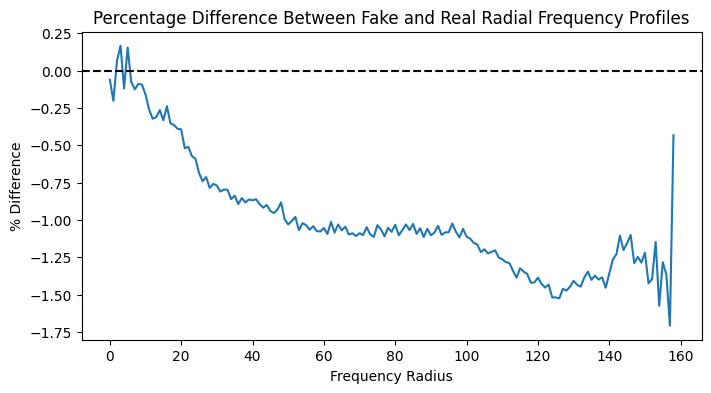

In [234]:
difference_percent = (profiles["fake"] - profiles["real"]) / profiles["real"] * 100

plt.figure(figsize=(8,4))
plt.plot(difference_percent)
plt.axhline(0, color="black", linestyle="--") # 0 line
plt.xlabel("Frequency Radius")
plt.ylabel("% Difference")
plt.title("Percentage Difference Between Fake and Real Radial Frequency Profiles")
plt.show()

## Model

In [3]:
class RealFakeDataModule(pl.LightningDataModule):

    def __init__(self, train_path, valid_path, test_path, batch_size=64, num_workers=0, subset_fraction=None, subset_seed=22):

        super().__init__()

        self.train_path = train_path
        self.valid_path = valid_path
        self.test_path = test_path

        self.batch_size = batch_size
        self.num_workers = num_workers

        self.subset_fraction = subset_fraction
        self.subset_seed = subset_seed
    
        self.train_transform = T.Compose([
            T.Resize((224, 224)),
            T.RandomHorizontalFlip(p=0.5), # augmentation
            T.ToTensor(),
            T.Normalize(
                mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]
            )
        ])

        self.eval_transform = T.Compose([
            T.Resize((224, 224)),
            T.ToTensor(),
            T.Normalize(
                mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]
            )
        ])

    def _balanced_subset(self, dataset, apply_subset=True):

        if self.subset_fraction is None or not apply_subset:
            return dataset

        rng = random.Random(self.subset_seed)

        indices_by_class = {0: [], 1: []}

        for idx, (_, label) in enumerate(dataset.samples):
            indices_by_class[label].append(idx)

        selected = []

        for label in [0, 1]:

            n_samples = int(len(indices_by_class[label]) * self.subset_fraction)
            selected.extend(rng.sample(indices_by_class[label], n_samples))

        rng.shuffle(selected)

        return Subset(dataset, selected)

    def setup(self, stage=None):

        self.train_dataset = ImageFolder(self.train_path, transform=self.train_transform)
        self.val_dataset = ImageFolder(self.valid_path, transform=self.eval_transform)
        self.test_dataset = ImageFolder(self.test_path, transform=self.eval_transform)

        self.train_dataset = self._balanced_subset(self.train_dataset, apply_subset=True)
        self.val_dataset = self._balanced_subset(self.val_dataset, apply_subset=True)
        self.test_dataset = self._balanced_subset(self.test_dataset, apply_subset=False) # full test set

        dataset_ref = (self.train_dataset.dataset if isinstance(self.train_dataset, Subset) else self.train_dataset)

        print("Class mapping:", dataset_ref.class_to_idx)
        print(f"Train: {len(self.train_dataset)}")
        print(f"Validation: {len(self.val_dataset)}")
        print(f"Test: {len(self.test_dataset)}")

    def train_dataloader(self):
        return DataLoader(
            self.train_dataset,
            batch_size=self.batch_size,
            shuffle=True,
            num_workers=self.num_workers
        )

    def val_dataloader(self):
        return DataLoader(
            self.val_dataset,
            batch_size=self.batch_size,
            shuffle=False,
            num_workers=self.num_workers
        )

    def test_dataloader(self):
        return DataLoader(
            self.test_dataset,
            batch_size=self.batch_size,
            shuffle=False,
            num_workers=self.num_workers
        )

In [4]:
data_module = RealFakeDataModule(
    TRAIN_PATH,
    VALID_PATH,
    TEST_PATH,
    subset_fraction=0.10,
    subset_seed=22
)
data_module.setup()

Class mapping: {'fake': 0, 'real': 1}
Train: 10000
Validation: 2000
Test: 20000


In [21]:
class RealFakeResNet(pl.LightningModule):

    def __init__(self, learning_rate=1e-4):
        super().__init__()

        self.save_hyperparameters()

        self.learning_rate = learning_rate

        weights = ResNet18_Weights.DEFAULT
        self.model = resnet18(weights=weights)

        in_features = self.model.fc.in_features
        self.model.fc = nn.Linear(in_features, 1) # attach binary classifier to pretrained CNN

        self.train_acc = BinaryAccuracy()
        self.val_acc = BinaryAccuracy()
        self.test_acc = BinaryAccuracy()

    def forward(self, x):
        logits = self.model(x)
        logits = logits.squeeze(1)
        return logits

    def training_step(self, batch, batch_idx):
        images, labels = batch
        labels = labels.float()

        logits = self(images)
        loss = F.binary_cross_entropy_with_logits(logits, labels)

        probs = torch.sigmoid(logits)
        acc = self.train_acc(probs, labels.int())

        self.log("train_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("train_acc", acc, prog_bar=True, on_step=False, on_epoch=True)

        return loss

    def validation_step(self, batch, batch_idx):
        images, labels = batch
        labels_float = labels.float()

        logits = self(images)
        loss = F.binary_cross_entropy_with_logits(logits, labels_float)

        probs = torch.sigmoid(logits)

        self.log("val_loss", loss, prog_bar=True)
        self.log("val_acc", self.val_acc(probs, labels), prog_bar=True)

        return loss

    def test_step(self, batch, batch_idx):
        images, labels = batch
        labels_float = labels.float()

        logits = self(images)
        loss = F.binary_cross_entropy_with_logits(logits, labels_float)

        probs = torch.sigmoid(logits)

        self.log("test_loss", loss, prog_bar=True)
        self.log("test_acc", self.test_acc(probs, labels), prog_bar=True)

        return loss

    def configure_optimizers(self):
        return torch.optim.AdamW(
            self.parameters(),
            lr=self.learning_rate,
            weight_decay=1e-4
        )

In [22]:
model = RealFakeResNet(
    learning_rate=1e-4
)

early_stopping = EarlyStopping(
    monitor="val_loss",
    mode="min",
    patience=7,
    verbose=True
)

checkpoint_callback = ModelCheckpoint(
    monitor="val_loss",
    mode="min",
    save_top_k=1,
    filename="resnet18"
)

logger = TensorBoardLogger(
    save_dir="lightning_logs",
    name="real_fake_resnet18"
)

In [16]:
from torchinfo import summary

summary(
    model,
    input_size=(1, 3, 224, 224),  # (batch, channels, H, W)
    col_names=["input_size", "output_size", "num_params"]
)

Layer (type:depth-idx)                        Input Shape               Output Shape              Param #
RealFakeResNet                                [1, 3, 224, 224]          [1]                       --
├─ResNet: 1-1                                 [1, 3, 224, 224]          [1, 1]                    --
│    └─Conv2d: 2-1                            [1, 3, 224, 224]          [1, 64, 112, 112]         9,408
│    └─BatchNorm2d: 2-2                       [1, 64, 112, 112]         [1, 64, 112, 112]         128
│    └─ReLU: 2-3                              [1, 64, 112, 112]         [1, 64, 112, 112]         --
│    └─MaxPool2d: 2-4                         [1, 64, 112, 112]         [1, 64, 56, 56]           --
│    └─Sequential: 2-5                        [1, 64, 56, 56]           [1, 64, 56, 56]           --
│    │    └─BasicBlock: 3-1                   [1, 64, 56, 56]           [1, 64, 56, 56]           73,984
│    │    └─BasicBlock: 3-2                   [1, 64, 56, 56]           [1, 64

In [23]:
trainer = pl.Trainer(
    max_epochs=20,
    callbacks=[
        early_stopping,
        checkpoint_callback
    ],
    accelerator="auto",
    devices="auto",
    logger=logger,
    enable_progress_bar=True
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [103]:
trainer.fit(model, datamodule=data_module)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Class mapping: {'fake': 0, 'real': 1}
Train: 10000
Validation: 2000
Test: 2000



  | Name      | Type           | Params | Mode 
-----------------------------------------------------
0 | model     | ResNet         | 11.2 M | train
1 | train_acc | BinaryAccuracy | 0      | train
2 | val_acc   | BinaryAccuracy | 0      | train
3 | test_acc  | BinaryAccuracy | 0      | train
-----------------------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.708    Total estimated model params size (MB)
71        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 0.226


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.114 >= min_delta = 0.0. New best score: 0.112


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.102


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.024 >= min_delta = 0.0. New best score: 0.078


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.072


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.071


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 0.058


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 0.043


Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.


In [ ]:
#torch.save(model.state_dict(), "resnet10.pth")

## Results

In [24]:
from pathlib import Path

checkpoint_path = Path("../outputs_hpc_140k/checkpoints/140kfaces__resnet18__1.0/best.ckpt")
best_model = RealFakeResNet.load_from_checkpoint(checkpoint_path)
best_model.eval()

RealFakeResNet(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, trac

### Training curves

In [14]:
def load_tensorboard_metrics(log_dir):

    event_acc = EventAccumulator(log_dir)
    event_acc.Reload()

    metrics = {}

    for tag in event_acc.Tags()["scalars"]:

        events = event_acc.Scalars(tag)

        metrics[tag] = {
            "steps": [x.step for x in events],
            "values": [x.value for x in events]
        }

    return metrics

log_dir = "../outputs_hpc_140k/logs/140kfaces__resnet18__1.0/version_0"
metrics = load_tensorboard_metrics(log_dir)
print(metrics.keys())

dict_keys(['hp_metric', 'train_loss_step', 'train_acc_step', 'epoch', 'val_loss', 'val_acc', 'train_loss_epoch', 'train_acc_epoch', 'test_loss', 'test_acc'])


In [17]:
def plot_training_curves(metrics, steps_per_epoch=None):

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    train_epochs = metrics["train_loss_epoch"]["steps"]
    val_epochs = metrics["val_loss"]["steps"]

    # LOSS
    axes[0].plot(train_epochs, metrics["train_loss_epoch"]["values"], label="Train Loss")
    axes[0].plot(val_epochs, metrics["val_loss"]["values"], label="Validation Loss")

    axes[0].set_title("Loss")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Loss")
    axes[0].legend()
    axes[0].grid()

    # ACCURACY
    axes[1].plot(train_epochs, metrics["train_acc_epoch"]["values"], label="Train Accuracy")
    axes[1].plot(val_epochs, metrics["val_acc"]["values"], label="Validation Accuracy")

    axes[1].set_title("Accuracy")
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Accuracy")
    axes[1].legend()
    axes[1].grid()

    plt.tight_layout()
    plt.show()

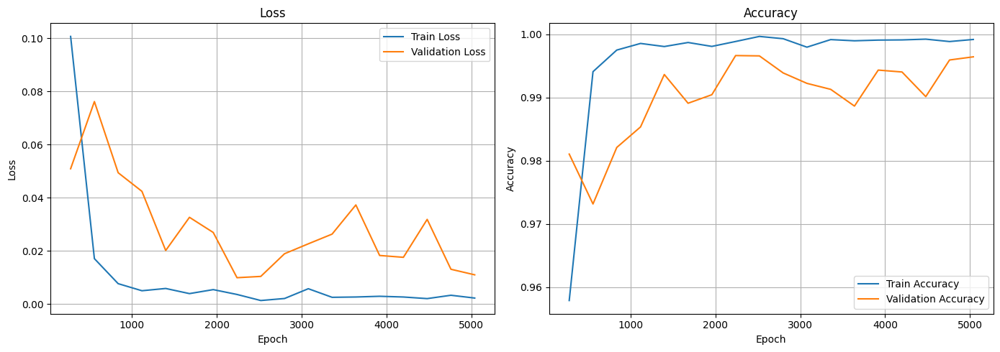

In [19]:
plot_training_curves(metrics)

In [78]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

In [79]:
def load_tensorboard_metrics(log_dir):

    event_acc = EventAccumulator(str(log_dir))
    event_acc.Reload()

    metrics = {}

    for tag in event_acc.Tags()["scalars"]:

        events = event_acc.Scalars(tag)

        metrics[tag] = {
            "steps": [x.step for x in events],
            "values": [x.value for x in events]
        }

    return metrics

In [80]:
def is_valid_training_run(metrics):

    required_metrics = [
        "val_loss",
        "val_acc",
        "train_loss_epoch",
        "train_acc_epoch"
    ]

    for metric_name in required_metrics:

        if metric_name not in metrics:
            return False

        if len(metrics[metric_name]["values"]) == 0:
            return False

    return True

In [81]:
def find_valid_versions(run_dir):

    run_dir = Path(run_dir)

    valid_versions = []

    for version_dir in sorted(run_dir.glob("version_*")):

        metrics = load_tensorboard_metrics(version_dir)

        if is_valid_training_run(metrics):

            best_val_acc = max(metrics["val_acc"]["values"])
            last_val_acc = metrics["val_acc"]["values"][-1]
            n_epochs = len(metrics["val_acc"]["values"])

            has_test = "test_acc" in metrics

            valid_versions.append({
                "version_dir": version_dir,
                "best_val_acc": best_val_acc,
                "last_val_acc": last_val_acc,
                "n_epochs": n_epochs,
                "has_test": has_test
            })

    return valid_versions

In [82]:
def print_valid_versions(run_dir):

    valid_versions = find_valid_versions(run_dir)

    for i, version in enumerate(valid_versions):

        print("INDEX:", i)
        print("VERSION:", version["version_dir"])
        print("BEST VAL ACC:", version["best_val_acc"])
        print("LAST VAL ACC:", version["last_val_acc"])
        print("EPOCHS:", version["n_epochs"])
        print("HAS TEST:", version["has_test"])
        print()

In [83]:
print_valid_versions("../outputs_hpc_140k/logs/140kfaces__resnet18__0.1")

INDEX: 0
VERSION: ..\outputs_hpc_140k\logs\140kfaces__resnet18__0.1\version_10
BEST VAL ACC: 0.9779999852180481
LAST VAL ACC: 0.9775000214576721
EPOCHS: 20
HAS TEST: True

INDEX: 1
VERSION: ..\outputs_hpc_140k\logs\140kfaces__resnet18__0.1\version_9
BEST VAL ACC: 0.9725000262260437
LAST VAL ACC: 0.968999981880188
EPOCHS: 18
HAS TEST: True



In [84]:
def find_best_version(run_dir):

    valid_versions = find_valid_versions(run_dir)

    if len(valid_versions) == 0:
        return None

    best_version = max(valid_versions, key=lambda x: x["best_val_acc"])

    return best_version

In [91]:
def get_epoch_axis(metrics, metric_name):

    values = metrics[metric_name]["values"]

    epochs = []

    for i in range(len(values)):
        epochs.append(i + 1)

    return epochs

In [92]:
def plot_single_training_curves(log_dir, title):

    metrics = load_tensorboard_metrics(log_dir)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    train_loss_epochs = get_epoch_axis(metrics, "train_loss_epoch")
    val_loss_epochs = get_epoch_axis(metrics, "val_loss")

    train_acc_epochs = get_epoch_axis(metrics, "train_acc_epoch")
    val_acc_epochs = get_epoch_axis(metrics, "val_acc")

    axes[0].plot(train_loss_epochs, metrics["train_loss_epoch"]["values"], label="Train Loss")
    axes[0].plot(val_loss_epochs, metrics["val_loss"]["values"], label="Validation Loss")

    axes[0].set_title("Loss")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Loss")
    axes[0].legend()
    axes[0].grid()

    axes[1].plot(train_acc_epochs, metrics["train_acc_epoch"]["values"], label="Train Accuracy")
    axes[1].plot(val_acc_epochs, metrics["val_acc"]["values"], label="Validation Accuracy")

    axes[1].set_title("Accuracy")
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Accuracy")
    axes[1].legend()
    axes[1].grid()

    fig.suptitle(title)

    plt.tight_layout()
    plt.show()

{'version_dir': WindowsPath('../outputs_hpc_140k/logs/140kfaces__resnet18__1.0/version_0'), 'best_val_acc': 0.996649980545044, 'last_val_acc': 0.9964500069618225, 'n_epochs': 18, 'has_test': True}


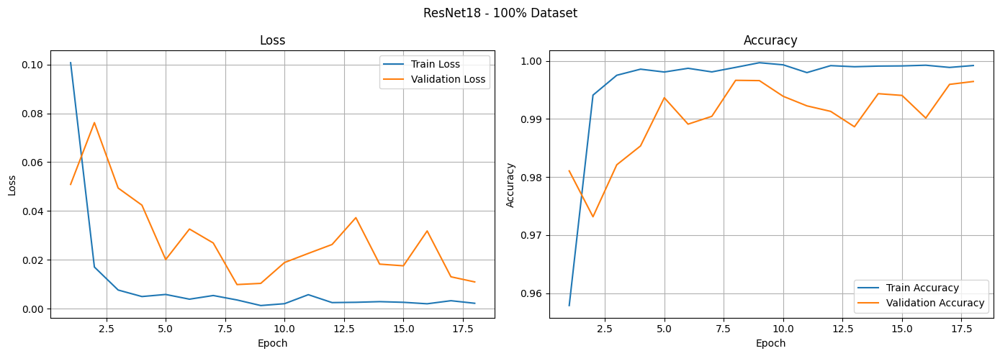

In [97]:
run_dir = "../outputs_hpc_140k/logs/140kfaces__resnet18__1.0"
best_version = find_best_version(run_dir)
print(best_version)
log_dir = best_version["version_dir"]
plot_single_training_curves(log_dir, title="ResNet18 - 100% Dataset")

{'version_dir': WindowsPath('../outputs_hpc_140k/logs/140kfaces__resnet18__0.1/version_10'), 'best_val_acc': 0.9779999852180481, 'last_val_acc': 0.9775000214576721, 'n_epochs': 20, 'has_test': True}


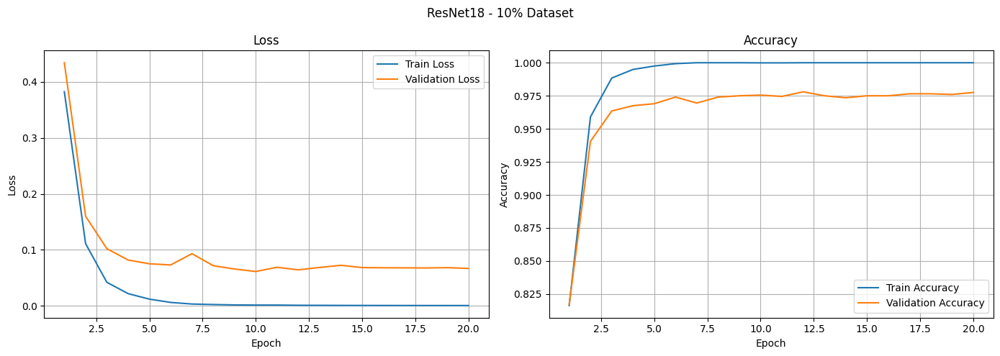

In [98]:
run_dir = "../outputs_hpc_140k/logs/140kfaces__resnet18__0.1"
best_version = find_best_version(run_dir)
print(best_version)
log_dir = best_version["version_dir"]
plot_single_training_curves(log_dir, title="ResNet18 - 10% Dataset")

{'version_dir': WindowsPath('../outputs_hpc_140k/logs/140kfaces__resnet18__0.01/version_0'), 'best_val_acc': 0.8899999856948853, 'last_val_acc': 0.8650000095367432, 'n_epochs': 20, 'has_test': False}


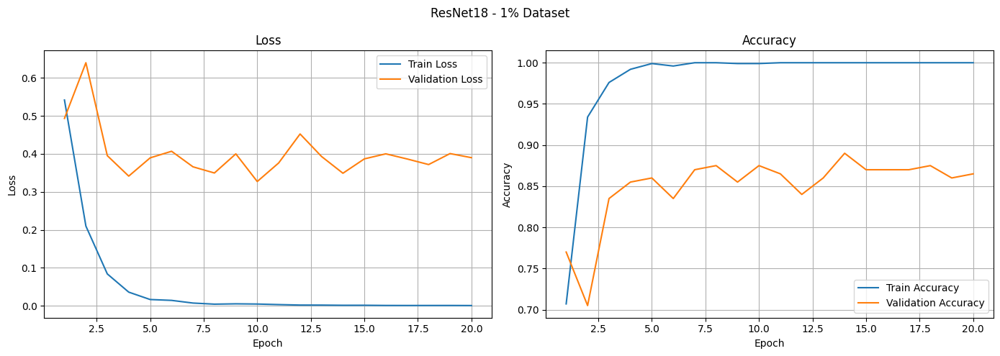

In [112]:
run_dir = "../outputs_hpc_140k/logs/140kfaces__resnet18__0.01"
best_version = find_best_version(run_dir)
print(best_version)
log_dir = best_version["version_dir"]
plot_single_training_curves(log_dir, title="ResNet18 - 1% Dataset")

{'version_dir': WindowsPath('../outputs_hpc_140k/logs/140kfaces__medium_cnn__1.0/version_0'), 'best_val_acc': 0.9973000288009644, 'last_val_acc': 0.9973000288009644, 'n_epochs': 102, 'has_test': True}


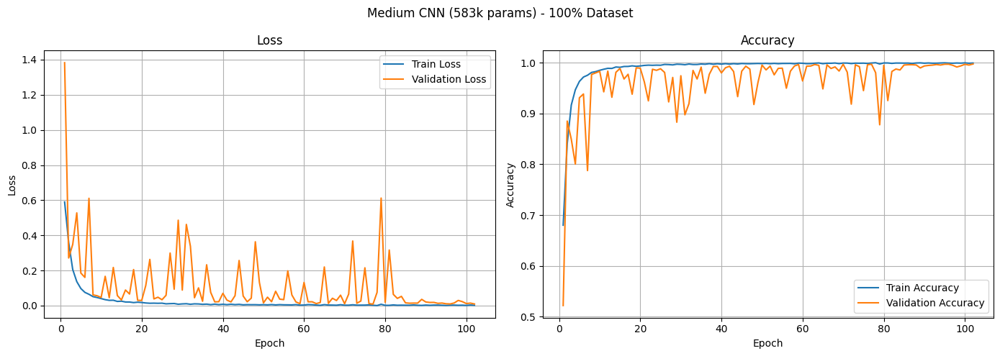

In [111]:
run_dir = "../outputs_hpc_140k/logs/140kfaces__medium_cnn__1.0"
best_version = find_best_version(run_dir)
print(best_version)
log_dir = best_version["version_dir"]
plot_single_training_curves(log_dir, title="Medium CNN (583k params) - 100% Dataset")

{'version_dir': WindowsPath('../outputs_hpc_140k/logs/140kfaces__medium_cnn__0.1/version_0'), 'best_val_acc': 0.9545000195503235, 'last_val_acc': 0.9545000195503235, 'n_epochs': 85, 'has_test': False}


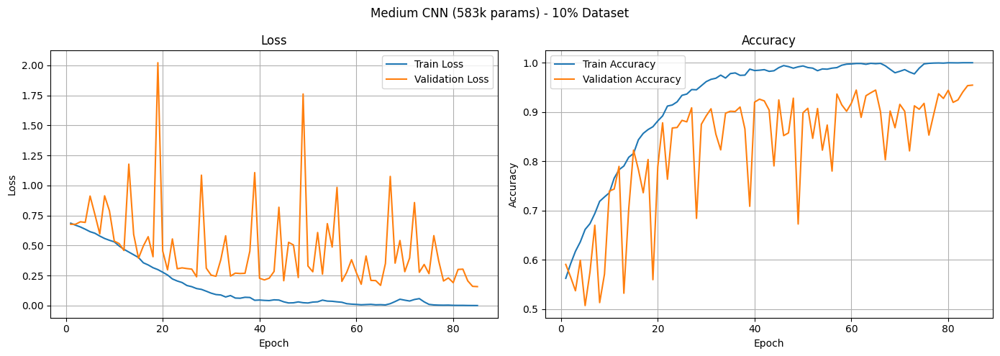

In [110]:
run_dir = "../outputs_hpc_140k/logs/140kfaces__medium_cnn__0.1"
best_version = find_best_version(run_dir)
print(best_version)
log_dir = best_version["version_dir"]
plot_single_training_curves(log_dir, title="Medium CNN (583k params) - 10% Dataset")

{'version_dir': WindowsPath('../outputs_hpc_140k/logs/140kfaces__medium_cnn__0.01/version_0'), 'best_val_acc': 0.6349999904632568, 'last_val_acc': 0.6349999904632568, 'n_epochs': 27, 'has_test': True}


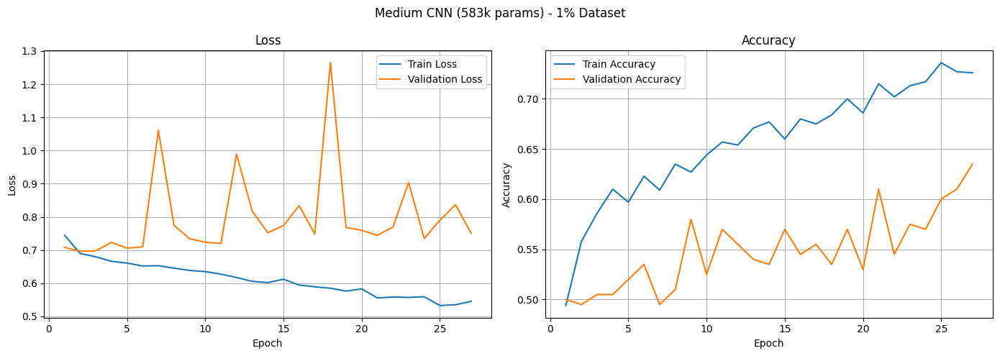

In [109]:
run_dir = "../outputs_hpc_140k/logs/140kfaces__medium_cnn__0.01"
best_version = find_best_version(run_dir)
print(best_version)
log_dir = best_version["version_dir"]
plot_single_training_curves(log_dir, title="Medium CNN (583k params) - 1% Dataset")

{'version_dir': WindowsPath('../outputs_hpc_140k/logs/140kfaces__small_cnn__1.0/version_0'), 'best_val_acc': 0.9189500212669373, 'last_val_acc': 0.8322499990463257, 'n_epochs': 75, 'has_test': True}


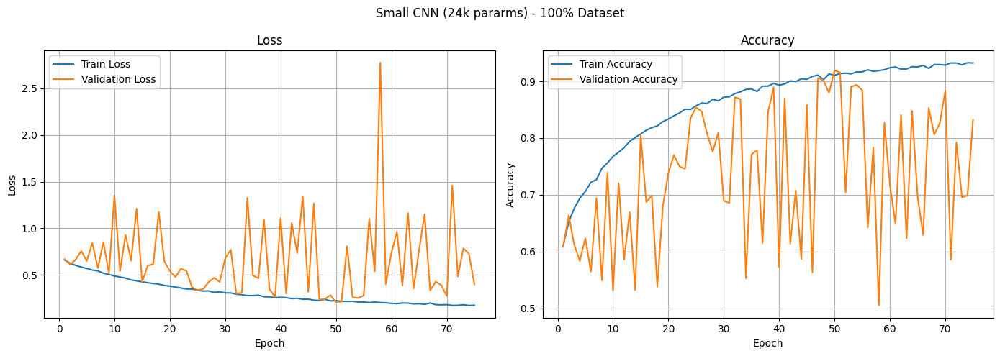

In [108]:
run_dir = "../outputs_hpc_140k/logs/140kfaces__small_cnn__1.0"
best_version = find_best_version(run_dir)
print(best_version)
log_dir = best_version["version_dir"]
plot_single_training_curves(log_dir, title="Small CNN (24k pararms) - 100% Dataset")

{'version_dir': WindowsPath('../outputs_hpc_140k/logs/140kfaces__small_cnn__0.1/version_1'), 'best_val_acc': 0.8270000219345093, 'last_val_acc': 0.6924999952316284, 'n_epochs': 237, 'has_test': True}


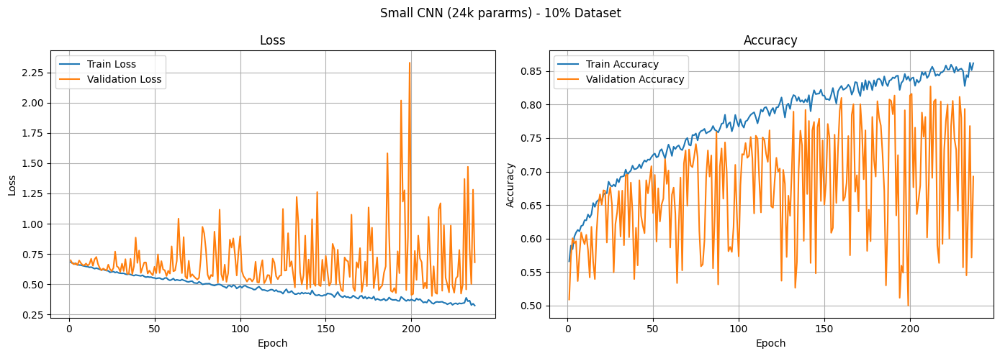

In [107]:
run_dir = "../outputs_hpc_140k/logs/140kfaces__small_cnn__0.1"
best_version = find_best_version(run_dir)
print(best_version)
log_dir = best_version["version_dir"]
plot_single_training_curves(log_dir, title="Small CNN (24k pararms) - 10% Dataset")

{'version_dir': WindowsPath('../outputs_hpc_140k/logs/140kfaces__small_cnn__0.01/version_0'), 'best_val_acc': 0.5550000071525574, 'last_val_acc': 0.550000011920929, 'n_epochs': 26, 'has_test': True}


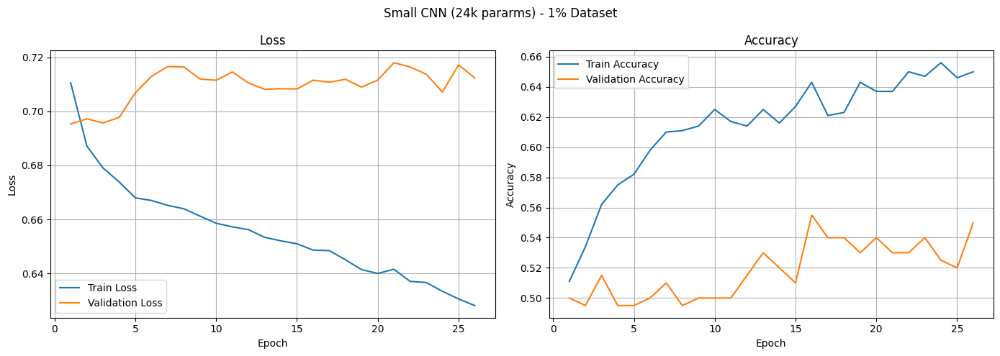

In [106]:
run_dir = "../outputs_hpc_140k/logs/140kfaces__small_cnn__0.01"
best_version = find_best_version(run_dir)
print(best_version)
log_dir = best_version["version_dir"]
plot_single_training_curves(log_dir, title="Small CNN (24k pararms) - 1% Dataset")

### Test set performance

1%  -> test_loss=0.315, test_acc=0.885

10% -> test_loss=0.044, test_acc=0.985

In [25]:
trainer.test(best_model, datamodule=data_module)

You are using a CUDA device ('NVIDIA RTX 500 Ada Generation Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Class mapping: {'fake': 0, 'real': 1}
Train: 10000
Validation: 2000
Test: 20000


c:\Users\tomma\anaconda3\envs\py310\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:433: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=21` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.9970999956130981     │
│         test_loss         │   0.009265960194170475    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.009265960194170475, 'test_acc': 0.9970999956130981}]

In [26]:
def get_predictions(model, data_module, threshold=0.5, device=None):

    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"

    dataloader = data_module.test_dataloader()

    model.eval()
    model.to(device)

    X = []
    y_true = []
    y_pred = []
    y_prob = []

    with torch.no_grad():

        for images, labels in dataloader:

            images = images.to(device)

            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > threshold).long()

            X.append(images.cpu())
            y_true.extend(labels.numpy())
            y_pred.extend(preds.cpu().numpy())
            y_prob.extend(probs.cpu().numpy())
    X = torch.cat(X, dim=0).numpy()

    return np.array(X), np.array(y_true), np.array(y_pred), np.array(y_prob)

In [27]:
X_test, y_true, y_pred, y_prob = get_predictions(best_model, data_module)

In [29]:
from sklearn.metrics import classification_report
print(classification_report(y_true, y_pred, target_names=["fake", "real"], digits=4))

              precision    recall  f1-score   support

        fake     0.9959    0.9983    0.9971     10000
        real     0.9983    0.9959    0.9971     10000

    accuracy                         0.9971     20000
   macro avg     0.9971    0.9971    0.9971     20000
weighted avg     0.9971    0.9971    0.9971     20000



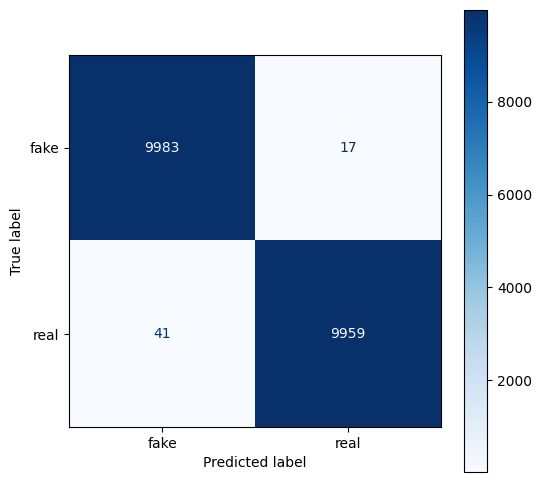

In [30]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["fake", "real"])
    fig, ax = plt.subplots(figsize=(6, 6))
    disp.plot(ax=ax, cmap="Blues")
    plt.show()

plot_confusion_matrix(y_true, y_pred)

In [31]:
# helper
def unnormalize_image(image):

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    image = image.transpose(1, 2, 0)
    image = (image * std) + mean

    return np.clip(image, 0, 1)

In [32]:
def show_random_predictions_grid(X, y_true, y_pred, y_prob, seed=42, n=20):

    rng = np.random.default_rng(seed)

    indices = rng.choice(len(X), size=min(n, len(X)), replace=False)

    fig, axes = plt.subplots(4, 5, figsize=(15, 12))
    axes = axes.flatten()

    class_names = ["fake", "real"]

    for i, ax in enumerate(axes):

        if i >= len(indices):
            ax.axis("off")
            continue

        idx = indices[i]

        image = unnormalize_image(X[idx])

        true_label = class_names[y_true[idx]]
        pred_label = class_names[y_pred[idx]]

        ax.imshow(image)

        ax.set_title(
            f"T: {true_label}\nP: {pred_label}\n{y_prob[idx]:.2f}",
            fontsize=10
        )

        ax.axis("off")

    plt.tight_layout()
    plt.show()

In [33]:
def show_wrong_predictions_grid(X, y_true, y_pred, y_prob, seed=42, n=20):

    rng = np.random.default_rng(seed)

    wrong_indices = np.where(y_true != y_pred)[0]

    if len(wrong_indices) == 0:
        print("No wrong predictions!")
        return

    indices = rng.choice(wrong_indices, size=min(n, len(wrong_indices)), replace=False)

    fig, axes = plt.subplots(4, 5, figsize=(15, 12))
    axes = axes.flatten()

    class_names = ["fake", "real"]

    for i, ax in enumerate(axes):

        if i >= len(indices):
            ax.axis("off")
            continue

        idx = indices[i]

        image = unnormalize_image(X[idx])

        true_label = class_names[y_true[idx]]
        pred_label = class_names[y_pred[idx]]

        ax.imshow(image)

        ax.set_title(
            f"T: {true_label}\nP: {pred_label}\n{y_prob[idx]:.2f}",
            fontsize=10,
            color="red"
        )

        ax.axis("off")

    plt.tight_layout()
    plt.show()

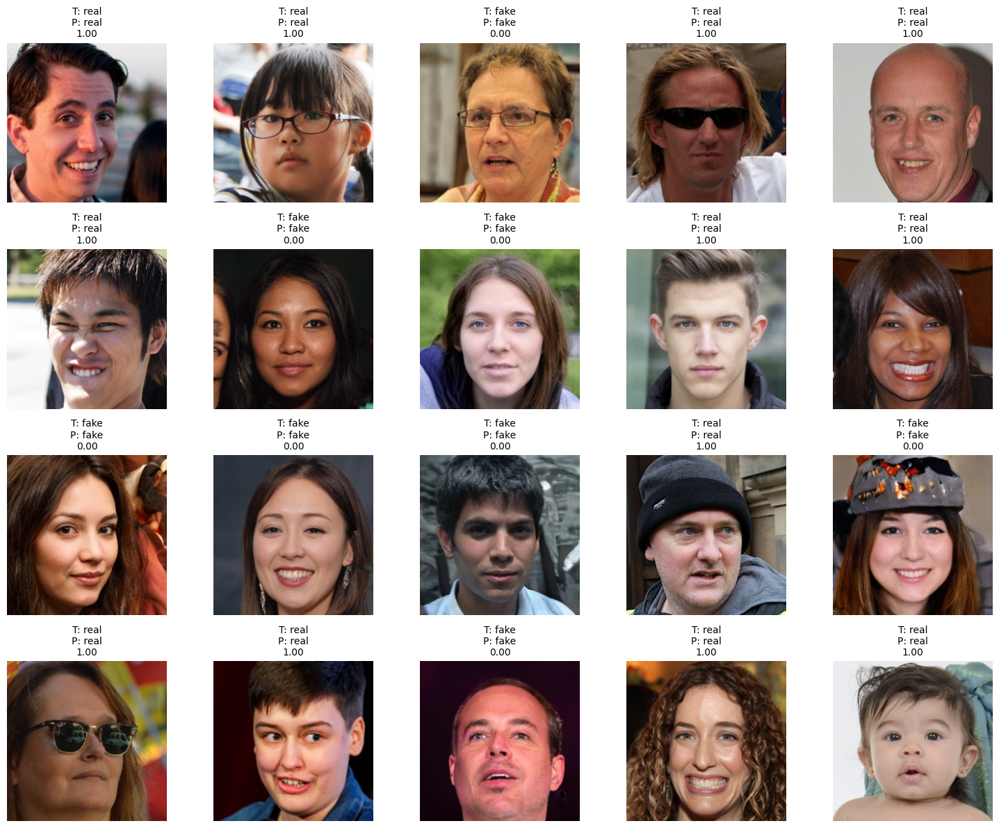

In [34]:
show_random_predictions_grid(X_test, y_true, y_pred, y_prob)


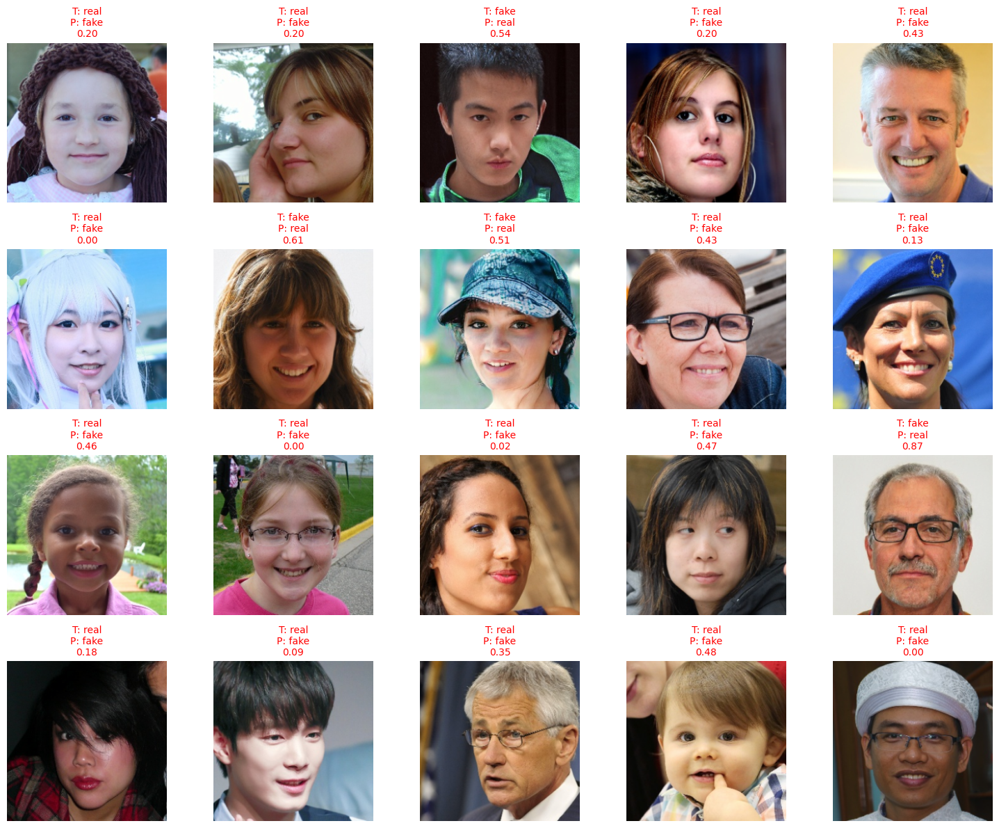

In [35]:
show_wrong_predictions_grid(X_test, y_true, y_pred, y_prob)

In [36]:
def show_confidence_stats(y_true, y_pred, y_prob):

    correct_conf = []
    wrong_conf = []

    for true, pred, prob in zip(y_true, y_pred, y_prob):

        confidence = prob if pred == 1 else 1 - prob

        if true == pred:
            correct_conf.append(confidence)
        else:
            wrong_conf.append(confidence)

    print(f"Correct predictions: {len(correct_conf)}")
    print(f"Wrong predictions: {len(wrong_conf)}\n")
    print(f"Average confidence (correct): {np.mean(correct_conf):.4f}")
    print(f"Average confidence (wrong):   {np.mean(wrong_conf):.4f}")

show_confidence_stats(y_true, y_pred, y_prob)

Correct predictions: 19942
Wrong predictions: 58

Average confidence (correct): 0.9977
Average confidence (wrong):   0.7889


Correct predictions: 19942
Wrong predictions: 58

Mean confidence (correct): 0.9977
Mean confidence (wrong):   0.7889



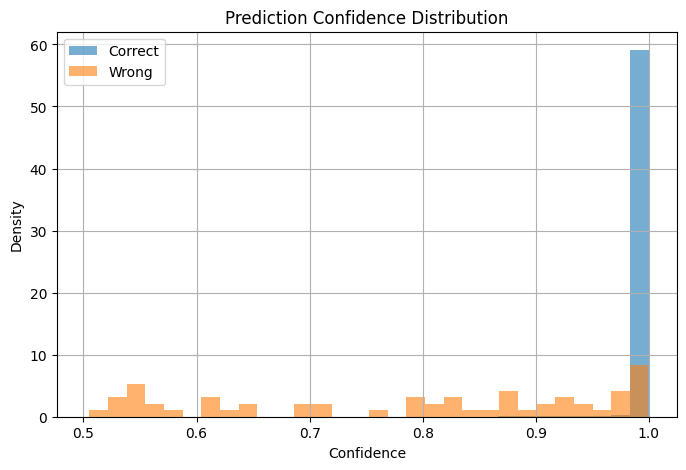

In [37]:
def analyze_confidence(y_true, y_pred, y_prob):

    correct_conf = []
    wrong_conf = []

    for true, pred, prob in zip(y_true, y_pred, y_prob):

        confidence = prob if pred == 1 else 1 - prob

        if true == pred:
            correct_conf.append(confidence)
        else:
            wrong_conf.append(confidence)

    correct_conf = np.array(correct_conf)
    wrong_conf = np.array(wrong_conf)

    print(f"Correct predictions: {len(correct_conf)}")
    print(f"Wrong predictions: {len(wrong_conf)}\n")
    print(f"Mean confidence (correct): {correct_conf.mean():.4f}")
    print(f"Mean confidence (wrong):   {wrong_conf.mean():.4f}")
    print()

    plt.figure(figsize=(8, 5))

    plt.hist(correct_conf, bins=30, alpha=0.6, density=True, label="Correct")
    plt.hist(wrong_conf, bins=30, alpha=0.6, density=True, label="Wrong")

    plt.xlabel("Confidence")
    plt.ylabel("Density")
    plt.title("Prediction Confidence Distribution")
    plt.legend()
    plt.grid()

    plt.show()

analyze_confidence(y_true, y_pred, y_prob)

## Explainability

In [38]:
def compute_gradcam(model, image_tensor, predicted_label, alpha=0.5):

    target_layers = [model.model.layer4[-1]] # last conv layer of ResNet18

    cam = GradCAM(model=model, target_layers=target_layers) # create Grad-CAM object

    target = [BinaryClassifierOutputTarget(int(predicted_label))] # model prediction, the output to explain

    grayscale_cam = cam(input_tensor=image_tensor.unsqueeze(0), targets=target)[0] # calculate Grad-CAM heatmap (224,224) 

    # unnormalize for visualization
    image = unnormalize_image(image_tensor.cpu().numpy())

    overlay = show_cam_on_image(image, grayscale_cam, use_rgb=True, image_weight=alpha) # overlay heatmap on image

    return image, overlay

In [39]:
def show_gradcam(model, X, y_true, y_pred, y_prob, idx):

    image_tensor = torch.tensor(X[idx], dtype=torch.float32)
    image, overlay = compute_gradcam(model, image_tensor, y_pred[idx])

    class_names = ["fake", "real"]
    confidence = y_prob[idx] if y_pred[idx] == 1 else 1 - y_prob[idx]

    # plot
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image) # original
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay) # Grad-CAM overlay
    plt.title("GradCAM")
    plt.axis("off")

    plt.suptitle(f"T: {class_names[y_true[idx]]} | P: {class_names[y_pred[idx]]} | {confidence:.2f}")

    plt.tight_layout()
    plt.show()

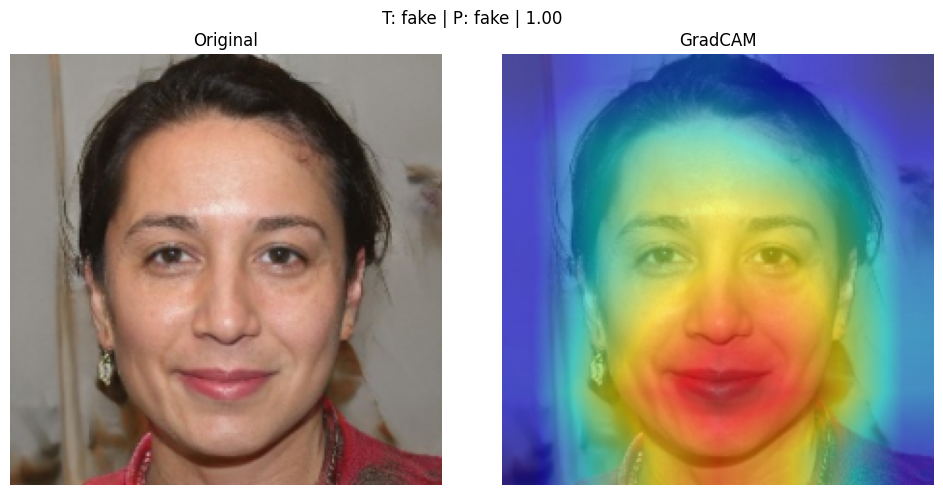

In [46]:
show_gradcam(best_model, X_test, y_true, y_pred, y_prob, idx=22)

In [47]:
def show_gradcams(model, X, y_true, y_pred, y_prob, indices):

    n = len(indices)
    cols = 5
    rows = int(np.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
    axes = np.array(axes).flatten()

    class_names = ["fake", "real"]

    for i, ax in enumerate(axes):

        if i >= n:
            ax.axis("off")
            continue

        idx = indices[i]

        image_tensor = torch.tensor(X[idx], dtype=torch.float32)

        _, overlay = compute_gradcam(model, image_tensor, y_pred[idx])
        confidence = y_prob[idx] if y_pred[idx] == 1 else 1 - y_prob[idx]

        ax.imshow(overlay)

        ax.set_title(
            f"T:{class_names[y_true[idx]]}\n"
            f"P:{class_names[y_pred[idx]]}\n"
            f"{confidence:.2f}",
            fontsize=8
        )

        ax.axis("off")

    plt.tight_layout()
    plt.show()

In [48]:
correct_fake_indices = np.where((y_true == 0) & (y_pred == 0))[0]
correct_real_indices = np.where((y_true == 1) & (y_pred == 1))[0]
wrong_fake_indices = np.where((y_true == 0) & (y_pred == 1))[0]
wrong_real_indices = np.where((y_true == 1) & (y_pred == 0))[0]

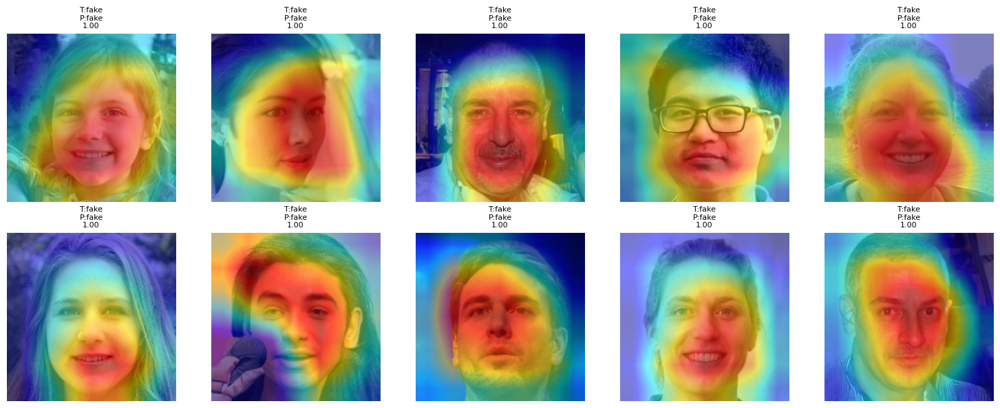

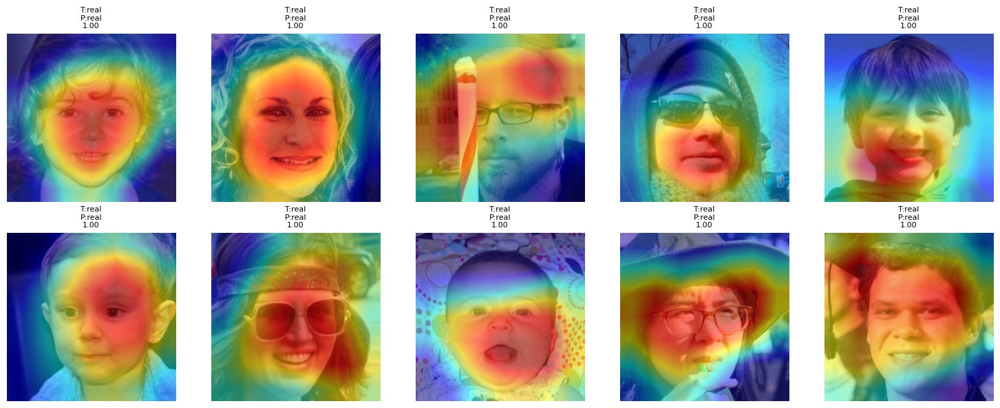

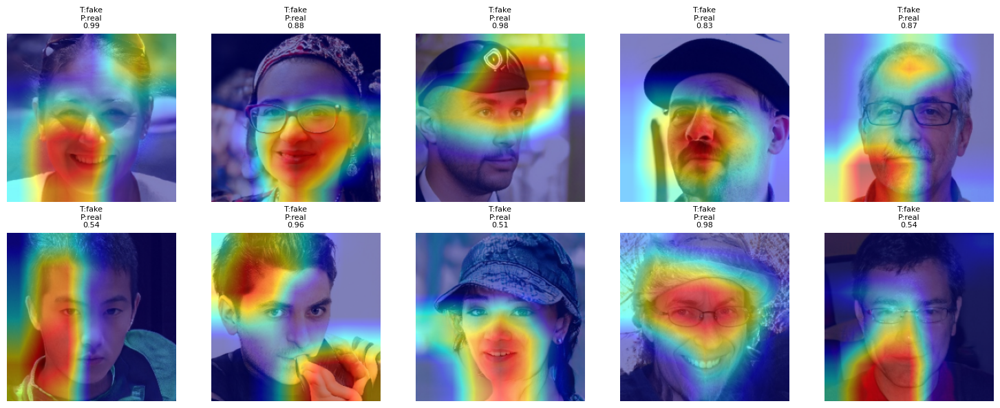

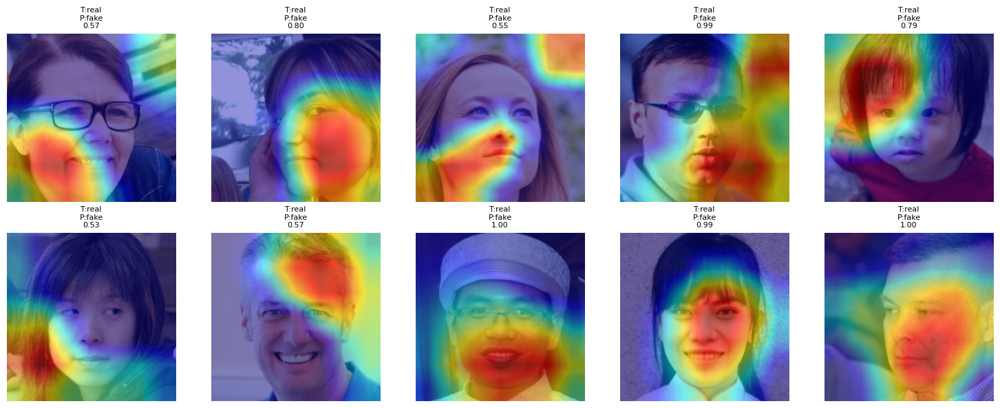

In [49]:
rng = np.random.default_rng(13)
show_gradcams(best_model, X_test, y_true, y_pred, y_prob, rng.choice(correct_fake_indices, size=10, replace=False))
show_gradcams(best_model, X_test, y_true, y_pred, y_prob, rng.choice(correct_real_indices, size=10, replace=False))
show_gradcams(best_model, X_test, y_true, y_pred, y_prob, rng.choice(wrong_fake_indices, size=10, replace=False))
show_gradcams(best_model, X_test, y_true, y_pred, y_prob, rng.choice(wrong_real_indices, size=10, replace=False))

## t-SNE

In [50]:
def plot_tsne(features, labels, title, max_points=2000, seed=22):

    rng = np.random.default_rng(seed)

    # standardize features
    features = StandardScaler().fit_transform(features)

    # dimensionality reduction with t-SNE
    tsne = TSNE(n_components=2, perplexity=30, learning_rate="auto", init="pca", random_state=seed)
    features_2d = tsne.fit_transform(features)

    plt.figure(figsize=(7, 6))

    # plot real and fake points
    plt.scatter(features_2d[labels == 0, 0], features_2d[labels == 0, 1], alpha=0.6, s=12, label="Fake")
    plt.scatter(features_2d[labels == 1, 0], features_2d[labels == 1, 1], alpha=0.6, s=12, label="Real")

    plt.title(title)
    plt.xlabel("t-SNE 1")
    plt.ylabel("t-SNE 2")
    plt.legend()
    plt.grid(alpha=0.3)

    plt.show()

In [51]:
# extract subsample from test set
def sample_test_loader(data_module, samples_per_class=1000, seed=22):

    rng = np.random.default_rng(seed)

    X_real = []
    X_fake = []

    dataloader = data_module.test_dataloader()

    for images, labels in dataloader:

        for image, label in zip(images, labels):

            # collect real samples
            if label == 1 and len(X_real) < samples_per_class:
                X_real.append(image.numpy())

            # collect fake samples
            elif label == 0 and len(X_fake) < samples_per_class:
                X_fake.append(image.numpy())

            # stop once enough samples have been collected
            if len(X_real) >= samples_per_class and len(X_fake) >= samples_per_class:
                break

        # stop iterating through batches
        if len(X_real) >= samples_per_class and len(X_fake) >= samples_per_class:
            break

    # create balanced dataset
    X = np.array(X_real + X_fake)
    y = np.array([1] * len(X_real) + [0] * len(X_fake))

    # shuffle samples
    indices = rng.permutation(len(X))

    return X[indices], y[indices]

In [52]:
X_tsne, y_tsne = sample_test_loader(data_module, samples_per_class=1000) # take 2000 of the 20000 images in the test set for the t-SNE visualizations

In [53]:
from sklearn.decomposition import PCA

def extract_pixel_features(X, pca_components=50):

    # flatten each image into a 1D feature vector
    features = np.array([image.flatten() for image in X])

    # 3×224×224 = 150528 -> 50
    pca = PCA(n_components=pca_components, random_state=22)
    features = pca.fit_transform(features)

    print(f"PCA: {X[0].size} → {pca_components} features\nExplained variance = {pca.explained_variance_ratio_.sum():.3f}")

    return features

In [54]:
def extract_fft_features(X, pca_components=50):

    features = []

    for image in X:

        image = unnormalize_image(image)
        gray = np.mean(image, axis=2) # mean of channels to get grayscale

        fft = np.fft.fft2(gray)
        fft = np.fft.fftshift(fft)
        
        spectrum = np.log(np.abs(fft) + 1)
        features.append(spectrum.flatten())

    features = np.array(features)
    num_feat = features.shape[1]

    # 224×224 = 50176 -> 50
    pca = PCA(n_components=pca_components, random_state=22)
    features = pca.fit_transform(features)

    print(f"PCA: {num_feat} → {pca_components} features\nExplained variance = {pca.explained_variance_ratio_.sum():.3f}")

    return features

In [55]:
def extract_cnn_features(model, X, pca_components=50, device=None):  # ResNet18: 512 features

    if device is None: device = "cuda" if torch.cuda.is_available() else "cpu"

    model.eval()
    model.to(device)

    # remove the final classification layer and keep only the feature extractor
    feature_extractor = torch.nn.Sequential(*list(model.model.children())[:-1]).to(device)

    features = []

    with torch.no_grad():

        for i in range(0, len(X), 64): # process images in batches of 64

            batch = torch.tensor(X[i:i + 64], dtype=torch.float32).to(device)
            output = feature_extractor(batch) # extract 512-dimensional CNN embeddings
            output = output.view(output.size(0), -1) # flatten from (batch, 512, 1, 1) to (batch, 512)
            features.append(output.cpu().numpy()) 

    features = np.concatenate(features)
    num_feat = features.shape[1]

    # 512 -> 50
    pca = PCA(n_components=pca_components, random_state=22)
    features = pca.fit_transform(features)

    print(f"PCA: {num_feat} → {pca_components} features\nExplained variance = {pca.explained_variance_ratio_.sum():.3f}")

    return features

PCA: 150528 → 50 features
Explained variance = 0.797


c:\Users\tomma\anaconda3\envs\py310\lib\site-packages\threadpoolctl.py:1226: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)


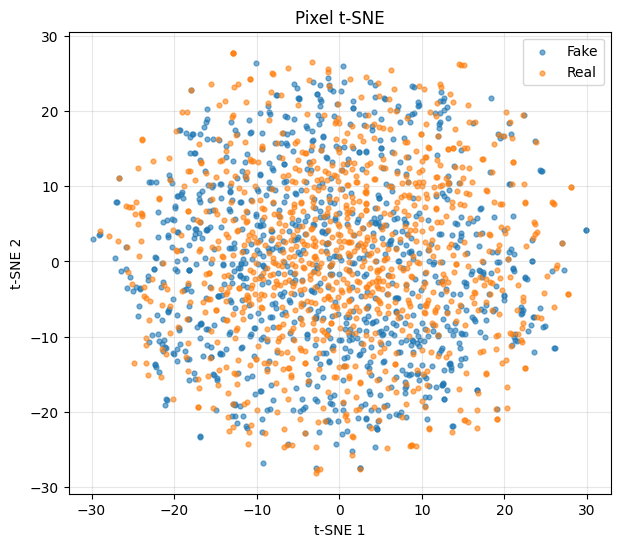

In [56]:
pixel_features = extract_pixel_features(X_tsne)
plot_tsne(pixel_features, y_tsne, "Pixel t-SNE")

PCA: 50176 → 50 features
Explained variance = 0.251


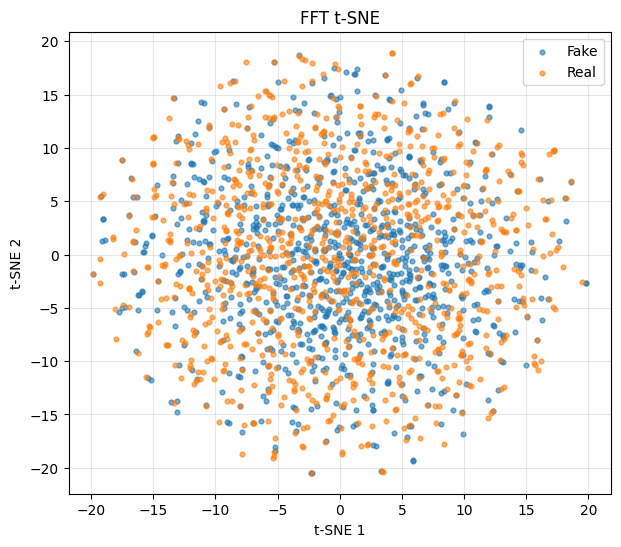

In [57]:
fft_features = extract_fft_features(X_tsne)
plot_tsne(fft_features, y_tsne, "FFT t-SNE")

PCA: 512 → 50 features
Explained variance = 0.986


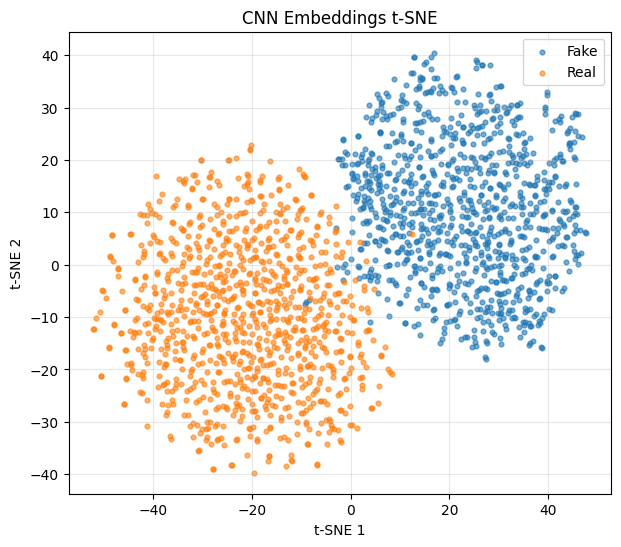

In [58]:
cnn_features = extract_cnn_features(best_model, X_tsne)
plot_tsne(cnn_features, y_tsne, "CNN Embeddings t-SNE")